In [5]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
data = pd.read_csv('../data/Metro_Interstate_Traffic_Volume_updated_1.csv')

In [7]:
data['date_time'] = pd.to_datetime(data['date_time'])


# Manual

In [19]:
## Moving Average Trend Visualization

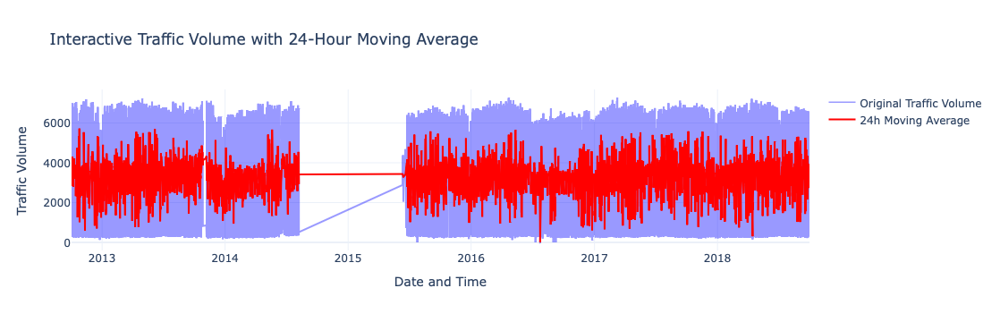

In [69]:

# Resample hourly average
hourly_traffic = data.set_index('date_time')['traffic_volume']

# Compute 24-hour moving average
moving_avg = hourly_traffic.rolling(window=24, center=True).mean()

# Create plot
fig = go.Figure()

# Add original line
fig.add_trace(go.Scatter(
    x=hourly_traffic.index,
    y=hourly_traffic.values,
    mode='lines',
    name='Original Traffic Volume',
    line=dict(color='blue'),
    opacity=0.4
))

# Add moving average line
fig.add_trace(go.Scatter(
    x=moving_avg.index,
    y=moving_avg.values,
    mode='lines',
    name='24h Moving Average',
    line=dict(color='red')
))

# Layout
fig.update_layout(
    title='Interactive Traffic Volume with 24-Hour Moving Average',
    xaxis_title='Date and Time',
    yaxis_title='Traffic Volume',
    template='plotly_white',
    hovermode='x unified'
)

fig.show()

In [70]:
len(hourly_traffic)

48204

In [73]:
data.shape

(48204, 18)

In [75]:
# Residuals Calculation

In [87]:
residuals = hourly_traffic - moving_avg

In [91]:
residuals[:30]

date_time
2012-10-02 09:00:00            NaN
2012-10-02 10:00:00            NaN
2012-10-02 11:00:00            NaN
2012-10-02 12:00:00            NaN
2012-10-02 13:00:00            NaN
2012-10-02 14:00:00            NaN
2012-10-02 15:00:00            NaN
2012-10-02 16:00:00            NaN
2012-10-02 17:00:00            NaN
2012-10-02 18:00:00            NaN
2012-10-02 19:00:00            NaN
2012-10-02 20:00:00            NaN
2012-10-02 21:00:00   -1219.958333
2012-10-02 22:00:00   -2033.291667
2012-10-02 23:00:00   -2614.750000
2012-10-03 00:00:00   -3095.500000
2012-10-03 01:00:00   -3308.250000
2012-10-03 02:00:00   -3407.041667
2012-10-03 03:00:00   -3289.791667
2012-10-03 04:00:00   -2759.750000
2012-10-03 05:00:00    -725.875000
2012-10-03 06:00:00    2360.541667
2012-10-03 08:00:00    3323.250000
2012-10-03 09:00:00    2388.416667
2012-10-03 12:00:00    2105.500000
2012-10-03 13:00:00    1978.500000
2012-10-03 14:00:00    2479.208333
2012-10-03 15:00:00    2859.041667
2012-10-03

In [180]:
total_anomalies = []
for i in np.arange(0, 3.1, 0.1):
    # print(i)
    threshold = residuals.std() * i  # or 3
    anomalies = residuals[abs(residuals) > threshold]
    total_anomalies.append(len(anomalies))

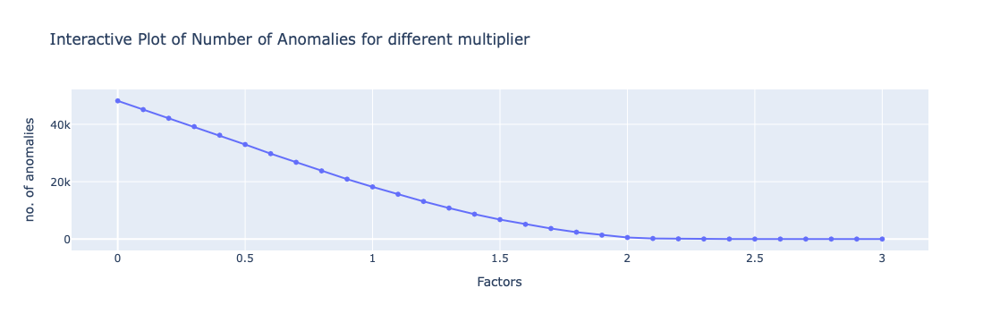

In [184]:
x = list(np.arange(0, 3.1, 0.1))
y = total_anomalies
fig = go.Figure()
fig.add_trace(go.Scatter(x=x, y=y, mode='lines+markers', name='y = x'))

fig.update_layout(
    title='Interactive Plot of Number of Anomalies for different multiplier',
    xaxis_title='Factors',
    yaxis_title='no. of anomalies',
    hovermode='x unified'
)

fig.show()


 2 is at the elbow of the trend, so deciding have 2 as a mulitplier.

In [193]:
threshold = residuals.std() * 2  # or 3
anomalies = residuals[abs(residuals) > threshold]


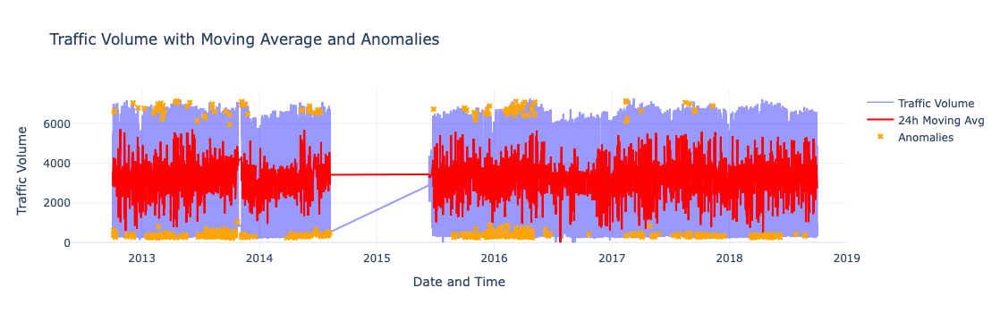

In [195]:
import plotly.graph_objects as go

fig = go.Figure()

# Original traffic volume
fig.add_trace(go.Scatter(
    x=hourly_traffic.index,
    y=hourly_traffic,
    mode='lines',
    name='Traffic Volume',
    line=dict(color='blue'),
    opacity=0.4
))

# Moving average
fig.add_trace(go.Scatter(
    x=moving_avg.index,
    y=moving_avg,
    mode='lines',
    name='24h Moving Avg',
    line=dict(color='red')
))

# Anomalies
fig.add_trace(go.Scatter(
    x=anomalies.index,
    y=hourly_traffic[anomalies.index],
    mode='markers',
    name='Anomalies',
    marker=dict(color='orange', size=6, symbol='x')
))

fig.update_layout(
    title='Traffic Volume with Moving Average and Anomalies',
    xaxis_title='Date and Time',
    yaxis_title='Traffic Volume',
    template='plotly_white',
    hovermode='x unified'
)

fig.show()


In [197]:
len(anomalies)

535

In [225]:
# Get the timestamps
anomaly_timestamps = anomalies.index.to_list()

#  View as DataFrame with values
anomaly_df = pd.DataFrame({
    'date_time': anomalies.index,
    'residual': anomalies.values
})

# Show top rows
print(anomaly_df)

              date_time     residual
0   2012-10-05 00:00:00 -3542.583333
1   2012-10-05 01:00:00 -3823.416667
2   2012-10-05 03:00:00 -3883.000000
3   2012-10-07 13:00:00  3736.416667
4   2012-10-07 14:00:00  3752.291667
..                  ...          ...
530 2018-06-06 02:00:00 -3533.833333
531 2018-06-07 02:00:00 -3511.625000
532 2018-07-26 02:00:00 -3501.791667
533 2018-08-23 01:00:00 -3551.958333
534 2018-08-23 03:00:00 -3588.541667

[535 rows x 2 columns]


In [201]:
data['is_holiday'].unique()

array(['Non-Holiday', 'Holiday'], dtype=object)

In [203]:
data['date_time'].unique()

<DatetimeArray>
['2012-10-02 09:00:00', '2012-10-02 10:00:00', '2012-10-02 11:00:00',
 '2012-10-02 12:00:00', '2012-10-02 13:00:00', '2012-10-02 14:00:00',
 '2012-10-02 15:00:00', '2012-10-02 16:00:00', '2012-10-02 17:00:00',
 '2012-10-02 18:00:00',
 ...
 '2018-09-30 14:00:00', '2018-09-30 15:00:00', '2018-09-30 16:00:00',
 '2018-09-30 17:00:00', '2018-09-30 18:00:00', '2018-09-30 19:00:00',
 '2018-09-30 20:00:00', '2018-09-30 21:00:00', '2018-09-30 22:00:00',
 '2018-09-30 23:00:00']
Length: 40575, dtype: datetime64[ns]

In [221]:
data[data['date_time'] == '2016-07-04 13:00:00']

,Unnamed: 0,holiday,temp,rain_1h,snow_1h,clouds_all,weather_main,weather_description,date_time,traffic_volume,weather_grouped,hour,day_of_week,is_weekend,month,date,is_holiday,holiday_full
24667,24667,NaN,297.63,0.0,0.0,75,Clouds,broken clouds,2016-07-04 13:00:00,2881,cloudy,13,0,False,7,2016-07-04,Holiday,Independence Day


In [233]:
anomalies

date_time
2012-10-05 00:00:00   -3542.583333
2012-10-05 01:00:00   -3823.416667
2012-10-05 03:00:00   -3883.000000
2012-10-07 13:00:00    3736.416667
2012-10-07 14:00:00    3752.291667
                          ...     
2018-06-06 02:00:00   -3533.833333
2018-06-07 02:00:00   -3511.625000
2018-07-26 02:00:00   -3501.791667
2018-08-23 01:00:00   -3551.958333
2018-08-23 03:00:00   -3588.541667
Name: traffic_volume, Length: 535, dtype: float64

In [239]:
anomaly_timestamps = anomalies.index  # hourly timestamps

# Filter data for rows that match anomaly hours
anomaly_rows = data[data['date_time'].isin(anomaly_timestamps)]


In [245]:
anomaly_rows.holiday_full.isna().sum()

536

In [247]:
len(anomaly_rows)

542